In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [2]:
df = pd.read_csv('train.csv')

df.shape

In [4]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


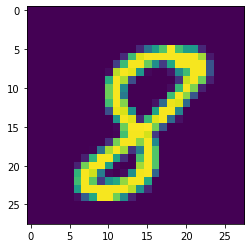

In [5]:
plt.imshow(df.iloc[105,1:].values.reshape(28,28))

In [6]:
x = df.iloc[:,1:]
y = df.iloc[:,0]

In [7]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.2,random_state = 40)

In [8]:
x_train.shape

(33600, 784)

In [9]:
from sklearn.neighbors import KNeighborsClassifier


In [10]:
knn = KNeighborsClassifier()

In [11]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [12]:
import time
start = time.time()
y_pred = knn.predict(x_test)
print(time.time() - start)

90.04856657981873


In [13]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,y_pred))

0.9636904761904762

In [14]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [15]:
x_train = scaler.fit_transform(x_train)

x_test = scaler.transform(x_test)


In [16]:
from sklearn.decomposition import PCA

In [17]:
pca = PCA(n_components = 200)

In [18]:
x_train_trf = pca.fit_transform(x_train)
x_test_trf = pca.transform(x_test)

In [19]:
x_train_trf.shape 

(33600, 200)

In [20]:
knn.fit(x_train_trf,y_train)

KNeighborsClassifier()

In [21]:
start = time.time()
y_pred = knn.predict(x_test_trf)
print(time.time() - start) 

5.808831453323364


In [34]:
y_pred

array([0, 2, 1, ..., 5, 6, 3])

In [22]:
accuracy_score(y_test,y_pred)

0.9441666666666667

In [23]:
pca = PCA(n_components = 2)
x_train_trans = pca.fit_transform(x_train)
x_test_trans = pca.transform(x_test)

#y_train_trans.shape

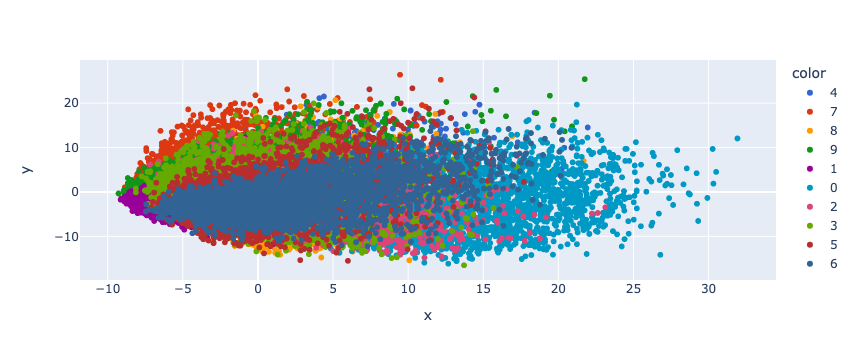

In [24]:
import plotly.express as px

y_train_trans = y_train.astype(str)

fig = px.scatter(x=x_train_trans[:,0],
                 y=x_train_trans[:,1],
                color=y_train_trans,
                 color_discrete_sequence=px.colors.qualitative.G10
                )

fig.show()

In [25]:
pca = PCA(n_components = 3)
x_train_trans = pca.fit_transform(x_train)
x_test_trans = pca.transform(x_test)


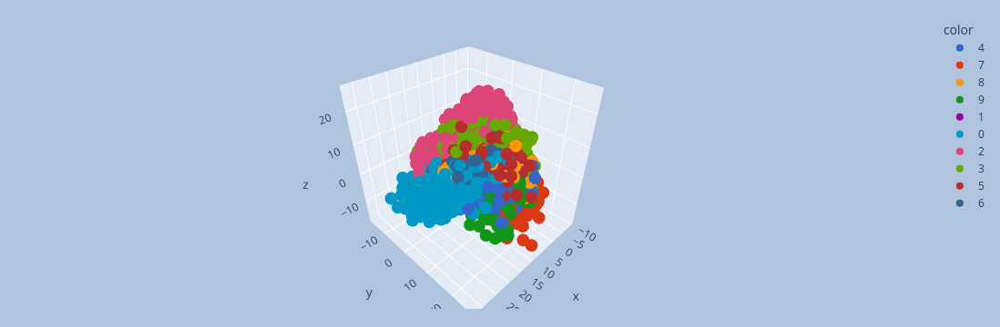

In [26]:
y_train_trans = y_train.astype(str)
fig = px.scatter_3d(x=x_train_trans[:,0],
                 y=x_train_trans[:,1],
                 z=x_train_trans[:,2],
                color=y_train_trans,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()